In [54]:
#Import dependencies
import numpy as np
import math
import random
import matplotlib.pyplot as plt #for plotting functions
from scipy.special import erfc
from numpy import sum,isrealobj,sqrt
from numpy.random import standard_normal
from scipy.special import erfc

### Required Functions ###

In [55]:
#BPSK Modulation
def bpsk_mod(mu,L):
    from scipy.signal import upfirdn
    s_bb = upfirdn(h=[1]*L, x=mu, up = L) # NRZ encoder; upfirdn: Upsample, FIR filter, and downsample.
    t=np.arange(start = 0,stop = len(mu)*L) #discrete time base
    return (s_bb,t)

#BPSK demodulation        
def bpsk_demod(r_bb,L):
    x = np.real(r_bb) # I arm
    x = np.convolve(x,np.ones(L)) # integrate for Tb duration (L samples)
    x = x[L-1:-1:L] # I arm - sample at every L
    ak_hat = (x > 0).transpose() # threshold detector
    return ak_hat

#Noise (AP to BD)
def noise(s,SNRdB,L=1):
    gamma = 10**(SNRdB/10) #SNR to linear scale
    if s.ndim==1: # if s is single dimensional vector
        P=L*sum(abs(s)**2)/len(s) #Actual power in the vector
    else: # multi-dimensional signals like MFSK
        P=L*sum(sum(abs(s)**2))/len(s) # if s is a matrix [MxN]
    N0=P/gamma # Find the noise spectral density
    if isrealobj(s): # check if input is real/complex object type
        n = sqrt(N0/2)*standard_normal(s.shape) # computed noise
    else:
        n = sqrt(N0/2)*(standard_normal(s.shape)+1j*standard_normal(s.shape))
    #r = s + n # received signal
    return n

#Noise (BD to AP)
def awgn(s,SNRdB,L=1):
    gamma = 10**(SNRdB/10) #SNR to linear scale
    if s.ndim==1: # if s is single dimensional vector
        P=L*sum(abs(s)**2)/len(s) #Actual power in the vector
    else: # multi-dimensional signals like MFSK
        P=L*sum(sum(abs(s)**2))/len(s) # if s is a matrix [MxN]
    N0=P/gamma # Find the noise spectral density
    if isrealobj(s): # check if input is real/complex object type
        n = sqrt(N0/2)*standard_normal(s.shape) # computed noise
    else:
        n = sqrt(N0/2)*(standard_normal(s.shape)+1j*standard_normal(s.shape))
    r = s + n # received signal #AWGN channel
    return r

# In theoretical analyses and simulations, for AWGN, the channel gain ℎ is often considered as a complex Gaussian random variable 
# with unity magnitude (i.e.,|ℎ∣=1) and uniformly distributed phase between 0 and 2π. This assumption simplifies 
# the analysis and is a common model used in communication theory to characterize the effects of the channel.

### More Required Functions ###

In [56]:
#Pathloss Model - Log distance
def logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,f,d0,d,L,sigma,n):
    #Pt_dBm = Transmitted power in dBm
    #G_BD_dBi = Gain of the BD antenna in dBi
    #G_AP_dBi = Gain of the AP antenna in dBi
    #f = frequency of transmitted signal in Hertz
    #d0 = reference distance of receiver from the transmitter in meters
    #d = array of distances at which the loss needs to be calculated
    #L = Other System Losses, for no Loss case L=1
    #sigma = Standard deviation of log Normal distribution (in dB)
    #n = path loss exponent
    #Pr_dBm = Received power in dBm
    #PL = path loss due to log normal shadowing
    lamda_ = (3*10**8)/f #Wavelength in meters
    K = 20*math.log10((4*np.pi*d0)/lamda_) # Path Loss factor *******- 10*n*math.log10(d0) - 10*math.log10(L) #path-loss factor
    X = sigma*np.random.randn() #normal random variable
    PL_dB = Gt_dBi + Gr_dBi + K + 10*n*math.log10(d/d0) + X  #PL(d) including antennas gains
    
    #Pr_dBm = Pt_dBm + PL #Receieved power in dBm at d meters
    return PL_dB


#AP-BD Channel Gain
def APBD_ChannelGain(f):
    Pt_dBm = 30 #1W AP transmission power 1W = 30dBm
    Gt_dBi = 1 #Gain of the AP antenna in dBi 
    Gr_dBi = 1 #Gain of the BD antenna in dBi
    d0 = 1 #reference distance of receiver from the transmitter in meters
    d = 3 #distance between AP and BD #Throughput reduces significantly after 4 meters ()
    L = 1 #Other System Losses, for no Loss case L=1
    sigma=2 #Standard deviation of log Normal distribution (in dB)
    n=2 # path loss exponent
    G_dB = - logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,f,d0,d,L,sigma,n)
    G = 10**(G_dB/10)
    return G

#J-AP Channel Gain
def JAP_ChannelGain(f):
    M = 5
    P_J = 10 #np.random.randint(low=1,high=M,dtype = int) #choose a number between 1-4
    Pt_dBm = 10*math.log10(P_J*1000) #selecting random jamming power between 1W - 4W
    Gt_dBi = 1 #Gain of the J antenna in dBi 
    Gr_dBi = 1 #Gain of the AP antenna in dBi
    d0 = 1 #reference distance of receiver from the transmitter in meters
    d = 2 #distance between J and AP
    L = 1 #Other System Losses, for no Loss case L=1
    sigma=2 #Standard deviation of log Normal distribution (in dB)
    n=2 # path loss exponent
    G_dB = - logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,f,d0,d,L,sigma,n)
    G = 10**(G_dB/10)
    return G

#J-BD Channel Gain
def JBD_ChannelGain(f):
    M = 5
    P_J = 10 #np.random.randint(low=1,high=M,dtype = int) #choose a number between 1-4
    Pt_dBm = 10*math.log10(P_J*1000) #selecting random jamming power between 1W - 4W
    Gt_dBi = 1 #Gain of the J antenna in dBi 
    Gr_dBi = 1 #Gain of the AP antenna in dBi
    d0 = 1 #reference distance of receiver from the transmitter in meters
    d = 2 #distance between J and AP
    L = 1 #Other System Losses, for no Loss case L=1
    sigma=2 #Standard deviation of log Normal distribution (in dB)
    n=2 # path loss exponent
    G_dB = - logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,f,d0,d,L,sigma,n)
    G = 10**(G_dB/10)
    return G

#Loopback Channel Gain (SIC)
def loopback_Channel():
    epsilon = 1e-10 #very small number
    Pt_dBm = 30 #should be same as AP transmission power
    #g_hat: feedback channel coefficient
    #g_bar = 7e-5 #g_bar: feedback channel coefficient estimation
    #g_tilde = 6e-5#g_tilde: estimation error
    #g_hat = g_bar + (sqrt(epsilon))*g_tilde 
    G = 1 #E[g_tilde**2]=1
    sigma = np.random.normal(loc=0.0, scale=1.0, size=None)
    phi = -20 #dBm 30dBm reduction = 60dB reduction, by current techniques, it has been reported that SI can be canceled up to −81 dB in analog domain
    combined_power_dB = (Pt_dBm+phi) + sigma**2
    combined_power = 10**(combined_power_dB/10)
    P = combined_power*epsilon*G
    return P

#print('X of APBD', APBD_ChannelGain(900e6)) #changing "logNormalShadowing" function to return X
#print('X of JBD', JBD_ChannelGain(900e6)) #changing "logNormalShadowing" function to return X
#print('X of JAP', JAP_ChannelGain(900e6)) #changing "logNormalShadowing" function to return X

#Comment: X follows same distribution for all channels (H,JAP,JBD), but X for each are different. Also, X changes in each time slot


### System Parameters ###

In [57]:
#System parameters
N=10000 # Number of symbols to transmit
L=16 # oversampling factor,L=Tb/Ts(Tb=bit period,Ts=sampling period) Tb (bit period) = symbol duration = (1/900MHz) = 1.1ns
deltaf = 10e6 #frequency step
Fc = 900e6 #900MHz #base carrier frequency
Fs=L*Fc # sampling frequency
#Backscatter Reflection Coefficient - when the tag wants to transmits a 1, it reflects and absorbs when it wants to transmit a 0
mu = np.random.randint(2, size=N) # uniform random symbols from 0's and 1's
(s_bb,t)= bpsk_mod(mu,L) # BPSK modulation(waveform) - baseband

In [58]:
print(s_bb)

[0. 0. 0. ... 1. 1. 1.]


#### AP and Jammer Signal ####

In [59]:
### numpy.random.randn => Return a sample (or samples) from the “standard normal” distribution. 
#[Recall: The standard normal distribution is a specific type of normal distribution where the mean is equal to 0 
#and the standard deviation is equal to 1.]
### numpy.random.normal => Draw random samples from a normal (Gaussian) distribution. 

x = (np.random.randn(N*L) + 1j*np.random.randn(N*L))/np.sqrt(2) #Complex Gaussian with unity power of size N*L (N: # of symbols generated)
x_J = (np.random.randn(N*L) + 1j*np.random.randn(N*L))/np.sqrt(2) #Complex Gaussian with unity power of size N*L (N: # of symbols generated)

### Noise ###

In [60]:
#random.normal(loc=0.0, scale=1.0, size=None); loc => mean, scale => Standard deviation of the distribution (must be non-negative
def complex_noise(mean, variance, size):
    # Generate real and imaginary parts separately with normal distribution
    real_part = np.random.normal(mean, np.sqrt(variance), size)
    imag_part = np.random.normal(mean, np.sqrt(variance), size)
    
    # Combine real and imaginary parts into complex numbers
    complex_noise = real_part + 1j * imag_part
    
    return complex_noise
#complex_noise = complex_noise(0, 1, N*L) # Mean = 0, Variance = 1, Size = N*L

### Jammer Strategy ###

In [61]:
def Jammer(n):
    M = 5 #Jammer power level upper limit
    P_J = 10 # np.random.randint(low=0,high=M,dtype = int) #choose a power level between 0 to 4 W and
    #P_J = 10*math.log10(P_J_Watt) + 30  #convert P_J to dBm
    deltaf = 10e6 #frequency step
    Fc = 900e6 #900MHz #base carrier frequency
    seq = [0,1]
    n = n+1
    if n == len(seq):
        n = 0
    k_J = seq[n]
    #print(n)
    f_J = Fc + (k_J*deltaf)  #Jammer staying only on one channel
    return (P_J,f_J,n)

In [68]:
## Mean Jamming Power Received at AP ##
def Mean_Jam_Power(P_J,f_J):
    Gt_dBi = 1 #Gain of the J antenna in dBi 
    Gr_dBi = 1 #Gain of the AP antenna in dBi
    lambda_ = (3*10**8)/(f_J)
    d = 2 #distance between J and AP or J and BD
    n=2 # path loss exponent
    PR_J = P_J*((Gt_dBi*Gr_dBi*(lambda_**2))/((d**n)*(4*np.pi)**2)) # in Watt
    return PR_J 

### State Space, Action Space ###

In [69]:
#State:
#AP can choose 2 channels, AP_state = [0,1]
#Jammer can be present or absent in the current channel, jammer_state = [0,1]

#Action:
#Action space is denoted by AP jumping into a channel, action_space = [0,1]

In [70]:
# Define AP_state and jammer_state
AP_state = [0, 1]
jammer_state = [1, 0] #1 => jammer present, 0=> jammer absent
# Define the action_space
action_space = [0, 1]

state_space = np.array(np.meshgrid(AP_state, jammer_state)).T.reshape(-1, 2)
print('State Space: \n',state_space)
q_table = np.zeros((len(state_space),len(action_space)))
print('\nQ-table: \n',q_table)

### for debugging

# q_table_int = np.random.randint(low = 1, high = 100, size=(len(AP_state),len(jammer_state),len(action_space)), dtype=int)
# print(q_table_int)
# print(np.shape(q_table_int))
# test = q_table_int[0,0,:] #cell_num,row_num,col_num #max_cell_num = 3,max_row_num = 1,max_col_num = 3
# print(test)

State Space: 
 [[0 1]
 [0 0]
 [1 1]
 [1 0]]

Q-table: 
 [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]


### Trainning Phase

In [98]:
#Number of steps each episode will have. 1 step = 1 time slot
nSteps = 400 #number of time steps, in each time step, AP chooses a new channel ## 1 time step = 1 time slot

In [100]:
#training parameters
#In this case, number of steps per episode = number of time slots per episode
#No terminating condition - each episode run up to "nSteps" - time slots

num_episodes = 200 #total no. of episodes the agent will play during training
max_steps_per_episode = nSteps #one of the terminating condition, max no. steps in a single episode

learning_rate = 0.1 #high LR focus more on new, less on old; low LR learn nothing, use prior knowledge
discount_rate = 0.99 #high DR focus more on distant reward, low DR focus more on immediate reward

#epsilon-greedy
exploration_rate = 1
max_exploration_rate = 1
min_exploration_rate = 0.01
exploration_decay_rate = 0.01

In [101]:
all_epochs = []
all_iterations = []
all_exploration_rate = []
rewards_all_steps = []
avg_reward_all_episodes = []
#rewards_current_step = 0
iterations = 0
epochs = 0
reward = np.zeros(max_steps_per_episode,dtype='float32')
P_R_AP = np.zeros(max_steps_per_episode,dtype='float32')
P_N = np.zeros(max_steps_per_episode,dtype='float32')
SNR = np.zeros(max_steps_per_episode,dtype='float32')

n= -1

# Q-learning algorithm
for episode in range(num_episodes):
    current_state = 0
    epochs += 1
    rewards_current_step = 0
    rewards_each_episode = []
    #avg_reward = 0
    for step in range(max_steps_per_episode):
        iterations += 1
        print('Current_state: ',current_state)
        # Exploration-exploitation trade-off
        p0 = random.uniform(0, 1)
        if p0 > exploration_rate:
            action = np.argmax(q_table[current_state][:]) #gives the index of the column with highest Q-value corresponding to row = current_state
            print('Exploited Action: ',action)
        else:
            action = random.choice(action_space)
            print('Random Action: ',action)
        k = action #channel is decided based on e-greedy
        f_k = Fc + (k*deltaf)
        P_T = 1 #AP transmission power: 1W
        
        #Jammer Strategy:
        (P_J,f_J,n) = Jammer(n)
        
        print('AP Channel: ',f_k)
        print('Jammer Channel: ',f_J)
        
        
#         if(f_J == f_k):
#             new_action = 1 - action #Set action equals any other value than a, since only 0/1 possible
#         else:
#             new_action = action
        
#         k = new_action #channel is decided based on jammer's behavior
#         f_k = Fc + (k*deltaf)
        
        P_R = ((s_bb**2)*P_T*(APBD_ChannelGain(f_k)**2)) #+ ((s_bb**2)*P_J*APBD_ChannelGain(f_k)*JBD_ChannelGain(f_J)) + P_J*JAP_ChannelGain(f_J) + loopback_Channel() + abs(complex_noise(0, 1, N*L))

        P_R_AP[step] = sum(P_R)/(N*L); SNR11=15; P_R_APP=sum(P_R)/(N*L);
        N_variance=P_R_APP/10**(SNR11/10);

        unwanted_signal = 1*(f_J==f_k)*Mean_Jam_Power(P_J,f_J) + loopback_Channel() + N_variance*abs(complex_noise(0, 1, N*L))


        P_N[step] = sum(unwanted_signal)/(N*L)

        SNR[step] =  P_R_AP[step]/P_N[step]



        #print(SNR)
        reward[step] = math.log2(1+SNR[step]) #SNR in linear scale will give throughput in bps; Here, throughput (reward) is in bps/Hz
        #print(reward)
        #next state
        if((action==0)and(f_J == f_k)):
            new_state = 0
        elif((action==0)and(f_J != f_k)):
            new_state = 1
        elif((action==1)and(f_J == f_k)):
            new_state = 2
        else:
            new_state = 3

        # Update Q-table for Q(s,a)
        q_table[current_state, action] = q_table[current_state, action] * (1 - learning_rate) + \
        learning_rate * (reward[step] + discount_rate * np.max(q_table[new_state, :]))
        # Transition to the next state
        current_state = new_state
        
#         print('action: ',action)
#         print('new_action: ',new_action)
        print('new_state: ',new_state)


        # Add new reward

        rewards_current_step = reward[step]
        rewards_each_episode.append(rewards_current_step)
        rewards_all_steps.append(rewards_current_step)
        all_iterations.append(iterations)
        
    avg_reward = sum(rewards_each_episode)/max_steps_per_episode
    avg_reward_all_episodes.append(avg_reward)
    # Exploration rate decay (at the end of one episode, we need to update the exploration rate)
    exploration_rate = min_exploration_rate + \
    (max_exploration_rate - min_exploration_rate) * np.exp(-exploration_decay_rate*episode)
    all_epochs.append(epochs)
    all_exploration_rate.append(exploration_rate)


Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jam

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9100

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9000

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9100

Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Ran

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  9

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9000

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_sta

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Ran

Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jam

Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0


Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jam

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Ch

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:

AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_sta

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  9

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Chann

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Ch

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_sta

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Ran

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  9

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Chann

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Chann

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  9

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  9

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  9

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_sta

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Ch

AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
n

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Ch

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Ran

Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jam

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Ch

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Chann

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Ch

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Chann

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1


Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state: 

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Chann

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Ch

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Chann

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Chann

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Chann

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Ch

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Chann

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_stat

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0


new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  9

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Ch

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Chann

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Ch

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Ch

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Chann

Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Ch

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_stat

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jam

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  9

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
n

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_s

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Ch

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Chann

Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_stat

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_s

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jam

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Ch

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Chann

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Ch

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_stat

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0

Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_s

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Ch

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9000000

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Chann

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chann

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_stat

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jam

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Ch

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_s

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Curren

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jam

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_s

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Chann

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1


new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Ch

Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_stat

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer

Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_s

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Ch

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Ch

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0


AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  9000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  9

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jam

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_s

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Ch

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  9000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Ch

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chan

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Acti

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Ch

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jam

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0


Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  9100

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
n

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

new_state:  2
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Ch

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_s

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0


Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jam

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3


new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  9000

Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Ch

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  9100000

Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Cur

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9100000

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Acti

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Chan

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
n

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Cur

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0


Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Ch

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Cur

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Curren

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Cur

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0


new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Ch

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Curren

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Rando

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploite

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state: 

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  9

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state: 

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state: 

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Rando

Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Chann

Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Curren

AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Curren

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jam

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jam

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Chann

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  9

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jam

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0


new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Curren

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0


new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Acti

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Chan

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  0
Current_state:  0
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Rando

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state: 

Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
A

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Acti

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Chan

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jam

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random A

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random A

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Curren

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Chann

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1

Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP C

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Chan

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  9000

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Rando

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP C

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  9

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:

new_state:  1
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0


new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Acti

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3


Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000

AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  9000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jam

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3


new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Rando

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900

Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_stat

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
A

new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Rando

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Acti

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000

AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:

Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP C

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Cur

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random A

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited A

Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state: 

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploite

Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state: 

new_state:  2
Current_state:  2
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Explo

new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  0
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited A

new_state:  1
Current_state:  1
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  1
AP Channel:  910000000.0
Jammer Channel:  910000000.0
new_state:  2
Current_state:  2
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  900000000.0
new_state:  0
Current_state:  0
Exploited Acti

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Explo

new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Random Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploite

new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1
Current_state:  1
Exploited Action:  1
AP Channel:  910000000.0
Jammer Channel:  900000000.0
new_state:  3
Current_state:  3
Exploited Action:  0
AP Channel:  900000000.0
Jammer Channel:  910000000.0
new_state:  1


In [102]:
# Print updated Q-table
print("\n\n********Q-table********\n")
print(q_table)



********Q-table********

[[105.99862743 104.86479515]
 [104.43432145 106.21963741]
 [104.84226803 105.56363026]
 [106.36517645 104.36539735]]


## Plots ##

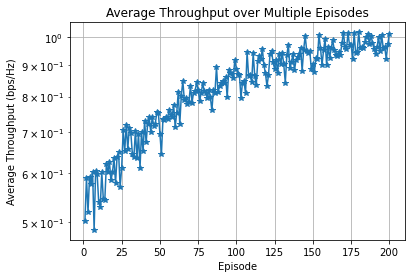

In [103]:
#Plotting average throughput over 100 episodes

fig1, ax1 = plt.subplots(nrows=1,ncols = 1)
ax1.semilogy(all_epochs,avg_reward_all_episodes,'-*')
ax1.set_xlabel(r'Episode')
ax1.set_ylabel(r'Average Throughput (bps/Hz)')
ax1.set_title('Average Throughput over Multiple Episodes')
plt.grid(True)

# plt.savefig('avg_throughput_all_episodes_200_episodes_10channels_800steps.png')

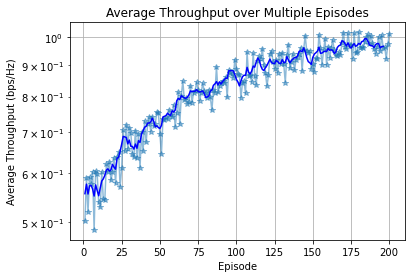

In [104]:
# import numpy as np
# import matplotlib.pyplot as plt

# Example data (replace this with your own data)
# episodes = np.arange(1, 101)  # episode numbers
# real_rewards = np.random.normal(0, 1, size=(100,))  # replace with your actual rewards

# Function to calculate a simple moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Set the window size for smoothing
window_size = 5

# Calculate the moving average of real rewards
smoothed_rewards = moving_average(avg_reward_all_episodes, window_size)

fig1, ax1 = plt.subplots(nrows=1,ncols = 1)
ax1.semilogy(all_epochs,avg_reward_all_episodes,'-*', alpha=0.5)
ax1.set_xlabel(r'Episode')
ax1.set_ylabel(r'Average Throughput (bps/Hz)')
ax1.set_title('Average Throughput over Multiple Episodes')
plt.grid(True)


# Plot the original real rewards with reduced opacity
# plt.plot(episodes, real_rewards, label='Real Rewards', color='blue', alpha=0.5)

# Plot the smoothed rewards
plt.plot(all_epochs[:-window_size+1], smoothed_rewards, label=f'Smoothed Rewards (Window Size={window_size})', color='blue')

# Add labels and legend
# plt.xlabel('Episode')
# plt.ylabel('Reward')
# plt.title('Average Reward vs Episode with Smoothed Rewards')
# plt.legend()

# Show the plot
# plt.show()

plt.savefig('Avg_Throughput_Round_Robinv2_400S_200E_2channels.png')


#### BD Battery State ####

In [108]:
E_B = np.zeros(nSteps)

for j in range(nSteps):
    P_T = 1 #AP transmission power: 1W
#     M = 10 #Jammer power level upper limit
#     P_J = np.random.randint(low=0,high=M,dtype = int) #choose a number between 1-4
    τ = 1 #e-3 #duration of 1 time slot = 1ms
    ξ = 0.8 #energy harvesting efficiency
    #levels = 5 #5 discrete levels of BD energy
    #E_levels = np.arange(1, levels+1, 1, dtype=int)
    n=-1
    (P_J,f_J,n) = Jammer(n)
    PR_J = Mean_Jam_Power(P_J,f_J)
    U_E = ξ*(PR_J+P_T)*τ
#     U_E = ξ*((PR_J+(P_T*(APBD_ChannelGain(f_k))**2)))*τ#*E_levels #Unit Energy #Signal energy doesn't depend upon frequency
    E_BC = 0.75*U_E # Let 1 Unit energy used, fixed, by tag circuit during BC operation
    E_EH = 0.25*U_E # Let 1 Unit energy used, fixed, by tag circuit during EH operation ### E_BC > E_EH
    E_h = U_E #Amount of energy harvested #Energy harvested is function of time and power
    E_B [j] = mu[j]*E_BC - (1 - mu[j])*E_EH + (1 - mu[j])*E_h + 1*U_E

In [109]:
print(E_B)

[1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267
 1.40246267 1.40246267 1.40246267 1.40246267 1.40246267 1.4024

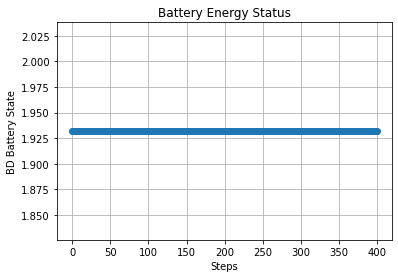

In [106]:
steps = np.arange(start = 0,stop=nSteps, step =1)
plt.plot(steps,E_B,'o-') 
plt.xlabel('Steps')
plt.ylabel('BD Battery State')
plt.title('Battery Energy Status')
plt.grid(True)
plt.show()

#plt.savefig('Bat_energy_status.png')

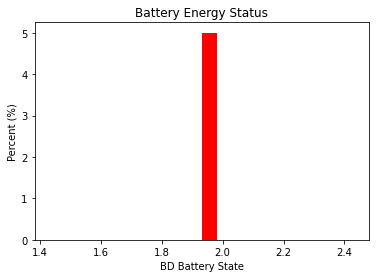

<Figure size 432x288 with 0 Axes>

In [129]:
# import numpy as np
# import matplotlib.pyplot as plt

# Generate an array of random values (replace this with your actual data)
# data = np.random.randn(400)

# Plot the histogram
plt.hist(E_B, bins=20, color = 'red')

# Add labels and title
plt.xlabel('BD Battery State')
plt.ylabel('Percent (%)')
plt.title('Battery Energy Status')

# Show the plot
plt.show()

#plt.savefig('BD_Bat_RR_400S_200E.png')

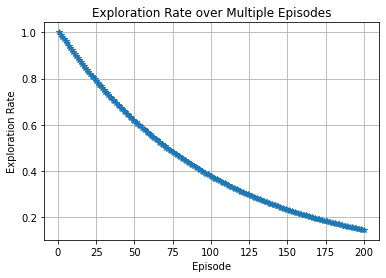

In [39]:
#Plotting exploration rate over multiple episodes

plt.plot(all_epochs,all_exploration_rate,'-*') 
plt.xlabel(r'Episode')
plt.ylabel(r'Exploration Rate')
plt.title('Exploration Rate over Multiple Episodes')
plt.grid(True)

#plt.savefig('exploration_rate.png')

### for debugging ###

In [29]:
f = 900e6
fJ = 900e6

# **** for path loss ****

# P_J = 20
# Pt_dBm = 10*math.log10(P_J*1000) #selecting random jamming power between 1W - 4W
# Gt_dBi = 1 #Gain of the Tx antenna in dBi 
# Gr_dBi = 1 #Gain of the Rx antenna in dBi
# d0 = 1 #reference distance of receiver from the transmitter in meters
# d = 10 # 
# dJ = 2 #distance between Tx and Rx
# L = 1 #Other System Losses, for no Loss case L=1
# sigma=2 #Standard deviation of log Normal distribution (in dB)
# n=2 #
# APBD_path_loss_dB = logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,f,d0,d,L,sigma,n)
# jammer_path_loss_dB = logNormalShadowing(Pt_dBm,Gt_dBi,Gr_dBi,fJ,d0,dJ,L,sigma,n)
# print('APBD Path Loss in dB: ',APBD_path_loss_dB)
# print('Jammer Path Loss in dB: ',jammer_path_loss_dB)

# **** for gain ****

H = APBD_ChannelGain(f)
JBD = JBD_ChannelGain(fJ)
JAP = JAP_ChannelGain(fJ)
print('AP - BD Channel Gain: ',H)
#print('AP - BD distance: ',d)
print('Jammer - AP Channel Gain: ',JAP)
print('Jammer - BD Channel Gain: ',JBD)
#print('Jammer - AP/BD Distance: ',dJ)

AP - BD Channel Gain:  8.358798669988254e-05
Jammer - AP Channel Gain:  0.00020574479287354197
Jammer - BD Channel Gain:  0.00015381176000592628


In [30]:
## Mean Jamming Power Received at AP ##
def Mean_Received_Jam_Power(P_J,f_J):
    Gt_dBi = 1 #Gain of the J antenna in dBi 
    Gr_dBi = 1 #Gain of the AP antenna in dBi
    lambda_ = (3*10**8)/(f_J)
    d = 2 #distance between J and AP
    n=2 # path loss exponent
    PR_J = P_J*((Gt_dBi*Gr_dBi*(lambda_**2))/((d**n)*(4*np.pi)**2)) # in Watt
    return PR_J 

In [53]:
n = -1 
#Jammer Strategy: Static Jammer
(P_J,f_J,n) = Jammer(n)

k = 1 # AP channel 
f_k = Fc + (k*deltaf)
print('Jammer channel: ',f_J)
print('AP Channel: ',f_k)
#f_J = 930e6
        #reflection coefficient: s_bb = -1 for mu = 0=> non-reflecting state, s_bb = 1 for mu = 1=>reflecting state
# unwanted_signal = Mean_Received_Jam_Power(P_J,f_J) + loopback_Channel()*abs(x) + abs(complex_noise(0, 1, N*L))
# y_AP_squared = ((s_bb**2)*P_T*APBD_ChannelGain(f_k)*abs(x)) + ((s_bb**2)*P_J*APBD_ChannelGain(f_k)*abs(x)*JBD_ChannelGain(f_J)*abs(x_J)) + loopback_Channel()*abs(x) + abs(complex_noise(0, 1, N*L))
#         #print(y_AP_squared[step])

P_R = ((s_bb**2)*P_T*(APBD_ChannelGain(f_k))**2) 
P_R_AP = sum(P_R)/(N*L) #Average Received Power
Noise_variance = (P_R_AP)/(10**(20/10)) #Desired SNR assumed to be 20dB
unwanted_signal = 1*(f_k == f_J)*P_J*JAP_ChannelGain(f_J) + loopback_Channel() + Noise_variance*abs(complex_noise(0, 1, N*L))
### 1*(f_k == f_J)*... => 0 if f_K is not equal to f_J
P_N = sum(unwanted_signal)/(N*L)
SNR =  P_R_AP/P_N
SNR_dB = 10*math.log(SNR)
# #print(SNR)
throughput = math.log2(1+SNR) #SNR in linear scale will give throughput in bps; Here, throughput (reward) is in bps/Hz
# print(unwanted_signal)
# print(y_AP_squared)
# print('AP Channel: ',f_k)
# print('Jammer Channel: ',f_J)
print('Received Power: ',P_R_AP)
print('Noise Power: ',P_N)
print('SNR: ',SNR)
print('SNR in dB: ',SNR_dB)
print('Throughput: ',throughput)


Jammer channel:  900000000.0
AP Channel:  910000000.0
Received Power:  5.637356220925042e-10
Noise Power:  1.0156824805814774e-09
SNR:  0.5550313536665179
SNR in dB:  -5.887306737385521
Throughput:  0.63694366930969
